# Analysis Pipeline — Food-101 / SHViT vs Baselines

Runs the full analysis after all 6 models are trained. Everything stays on Colab's local SSD (`/content/`) so you can inspect outputs in the file browser. At the end, a single zip is created which you can download or copy to Drive.

**Before running:** `Runtime → Change runtime type → A100 GPU` (T4 also works, just slower for the eval step).

### What this notebook does
1. Mounts Drive (read-only access to checkpoints + dataset)
2. Copies dataset to local SSD for fast reads
3. Pulls the latest analysis scripts from your repo
4. Runs `eda.py`, `evaluate_all.py`, `make_figures.py`, `error_analysis.py`, `demo.py` in order
5. Inspects results and zips everything for download

## 0. GPU check

In [1]:
import torch
print('PyTorch :', torch.__version__)
print('CUDA    :', torch.cuda.is_available())
if torch.cuda.is_available():
    print('GPU     :', torch.cuda.get_device_name(0))

PyTorch : 2.10.0+cu128
CUDA    : True
GPU     : NVIDIA A100-SXM4-40GB


## 1. Mount Drive (read-only access to checkpoints + dataset source)

In [2]:
from google.colab import drive
drive.mount('/content/drive')

# Source paths on Drive (where your trained models + dataset live)
DRIVE_DATA          = '/content/drive/MyDrive/food101_data'
DRIVE_BASELINES     = '/content/drive/MyDrive/food101_checkpoints'
DRIVE_SHVIT_FT      = '/content/drive/MyDrive/shvit_finetune'

# Local working paths (everything analysis-related stays here)
LOCAL_ROOT          = '/content/analysis'
LOCAL_DATA          = '/content/food101_local'   # large, kept separate
LOCAL_CHECKPOINTS   = f'{LOCAL_ROOT}/checkpoints'
LOCAL_RESULTS       = f'{LOCAL_ROOT}/results'
LOCAL_FIGURES       = f'{LOCAL_ROOT}/figures'
LOCAL_EDA           = f'{LOCAL_ROOT}/eda_outputs'
LOCAL_ERROR         = f'{LOCAL_ROOT}/error_analysis_outputs'
LOCAL_DEMO          = f'{LOCAL_ROOT}/demo_output'

import os
for p in [LOCAL_ROOT, LOCAL_CHECKPOINTS, LOCAL_RESULTS, LOCAL_FIGURES,
          LOCAL_EDA, LOCAL_ERROR, LOCAL_DEMO]:
    os.makedirs(p, exist_ok=True)

print('Local analysis root:', LOCAL_ROOT)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Local analysis root: /content/analysis


## 2. Copy dataset to local SSD

If `/content/food101_local` already exists from an earlier session, this skips the copy.

In [3]:
import shutil, time

if not os.path.exists(LOCAL_DATA):
    print('Copying ~5 GB dataset from Drive to local SSD...')
    t0 = time.time()
    shutil.copytree(DRIVE_DATA, LOCAL_DATA)
    print(f'Done in {time.time()-t0:.0f}s')
else:
    classes = len(os.listdir(f'{LOCAL_DATA}/food-101/images'))
    print(f'Already copied — {classes} class folders present')

Already copied — 101 class folders present


## 3. Copy trained checkpoints from Drive to local

Symlinks would also work, but copies are safer and only ~300 MB total.

In [4]:
# Layout matches what evaluate_all.py expects:
#   <repo>/Stage 2: baseline models/<model>/best.pth
#   <repo>/Stage 3: fine-tuning SHViT/<model>/best.pth
STAGE2_LOCAL = f'{LOCAL_CHECKPOINTS}/Stage 2: baseline models'
STAGE3_LOCAL = f'{LOCAL_CHECKPOINTS}/Stage 3: fine-tuning SHViT'
os.makedirs(STAGE2_LOCAL, exist_ok=True)
os.makedirs(STAGE3_LOCAL, exist_ok=True)

for model in ['resnet50', 'mobilenet_v2']:
    src_dir = f'{DRIVE_BASELINES}/{model}'
    dst_dir = f'{STAGE2_LOCAL}/{model}'
    if os.path.isdir(src_dir) and not os.path.isdir(dst_dir):
        shutil.copytree(src_dir, dst_dir)
        print(f'copied {model}: {os.path.getsize(f"{dst_dir}/best.pth")/1e6:.1f} MB')
    elif os.path.isdir(dst_dir):
        print(f'{model}: already present')
    else:
        print(f'WARNING: {model} not found at {src_dir}')

for model in ['shvit_s1', 'shvit_s2', 'shvit_s3', 'shvit_s4']:
    src_dir = f'{DRIVE_SHVIT_FT}/{model}'
    dst_dir = f'{STAGE3_LOCAL}/{model}'
    if os.path.isdir(src_dir) and not os.path.isdir(dst_dir):
        shutil.copytree(src_dir, dst_dir)
        print(f'copied {model}: {os.path.getsize(f"{dst_dir}/best.pth")/1e6:.1f} MB')
    elif os.path.isdir(dst_dir):
        print(f'{model}: already present')
    else:
        print(f'WARNING: {model} not found at {src_dir}')

resnet50: already present
mobilenet_v2: already present
shvit_s1: already present
shvit_s2: already present
shvit_s3: already present
shvit_s4: already present


## 4. Clone repos and install dependencies

Pulls the latest analysis scripts from your branch. If the repo already exists, `git pull` updates it.

In [5]:
REPO_DIR  = '/content/Vision_Project_spring_26'
REPO_URL  = 'https://github.com/saif-farid-tech/Vision_Project_spring_26.git'
BRANCH    = 'claude/setup-shvit-repo-6OXc1'
SHVIT_DIR = '/content/SHViT'

import os, shutil

if os.path.isdir(REPO_DIR):
    shutil.rmtree(REPO_DIR)

!git clone -b {BRANCH} {REPO_URL} {REPO_DIR}

if not os.path.isdir(SHVIT_DIR):
    !git clone https://github.com/ysj9909/SHViT.git {SHVIT_DIR}

# Copy analysis scripts to /content for clean invocation
for fname in ['eda.py', 'evaluate_all.py', 'make_figures.py',
              'error_analysis.py', 'demo.py',
              'augmentation.py', 'metrics.py', 'splits.py']:
    src = f'{REPO_DIR}/{fname}'
    if os.path.exists(src):
        shutil.copy(src, f'/content/{fname}')
        print(f'copied {fname}')
    else:
        print(f'MISSING: {fname} (push it to your branch first)')

Cloning into '/content/Vision_Project_spring_26'...
remote: Enumerating objects: 360, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 360 (delta 42), reused 41 (delta 41), pack-reused 315 (from 2)
Receiving objects: 100% (360/360), 363.27 MiB | 12.08 MiB/s, done.
Resolving deltas: 100% (160/160), done.
Updating files: 100% (41/41), done.
copied eda.py
copied evaluate_all.py
copied make_figures.py
copied error_analysis.py
copied demo.py
copied augmentation.py
copied metrics.py
copied splits.py


In [6]:
# Dependencies: timm pinned, fvcore for GFLOPs, seaborn for heatmaps
!pip install -q timm==0.5.4 --no-deps
!pip install -q einops==0.4.1 easydict fvcore seaborn
print('Deps installed.')

Deps installed.


## 5. EDA — sample grid, class distribution, image sizes

Quick (~2 min). No GPU needed.

In [7]:
!python /content/eda.py \
    --data-root  {LOCAL_DATA} \
    --output-dir {LOCAL_EDA}

print('\nEDA outputs:')
for f in sorted(os.listdir(LOCAL_EDA)):
    sz = os.path.getsize(f'{LOCAL_EDA}/{f}') / 1024
    print(f'  {f}  ({sz:.0f} KB)')

Train: 75,750  Test: 25,250  Classes: 101
Wrote eda_samples.png
Wrote eda_image_sizes.png
Wrote eda_class_distribution.png
Wrote eda_summary.txt

EDA outputs:
  eda_class_distribution.png  (370 KB)
  eda_image_sizes.png  (95 KB)
  eda_samples.png  (11336 KB)
  eda_summary.txt  (2 KB)


## 6. Full evaluation + benchmarks on the test set

This is the big one — runs all 6 models on the official 25,250-image test set, plus parameter / FLOPs / throughput / latency benchmarks. ~30 min on A100.

In [8]:
!python /content/evaluate_all.py \
    --checkpoints-dir {LOCAL_CHECKPOINTS} \
    --shvit-dir       {SHVIT_DIR} \
    --data-root       {LOCAL_DATA} \
    --output-dir      {LOCAL_RESULTS}

print('\nResults outputs:')
for root, dirs, files in os.walk(LOCAL_RESULTS):
    for f in files:
        full = os.path.join(root, f)
        rel  = os.path.relpath(full, LOCAL_RESULTS)
        sz   = os.path.getsize(full) / 1024
        print(f'  {rel}  ({sz:.0f} KB)')

Device: cuda
Test set: 25,250 images

=== resnet50 ===
Evaluating on 25250 images...
  Batch 0/395
  Batch 50/395
  Batch 100/395
  Batch 150/395
  Batch 200/395
  Batch 250/395
  Batch 300/395
  Batch 350/395
Top-1: 89.24%  |  Top-5: 97.96%
  GPU throughput @bs64: 2926 img/s
  CPU latency @bs1   : 36.89 ms
  -> /content/analysis/results/resnet50/results.json

=== mobilenet_v2 ===
Evaluating on 25250 images...
  Batch 0/395
  Batch 50/395
  Batch 100/395
  Batch 150/395
  Batch 200/395
  Batch 250/395
  Batch 300/395
  Batch 350/395
Top-1: 85.67%  |  Top-5: 97.16%
  GPU throughput @bs64: 6540 img/s
  CPU latency @bs1   : 17.21 ms
  -> /content/analysis/results/mobilenet_v2/results.json

=== shvit_s1 ===
Evaluating on 25250 images...
  Batch 0/395
  Batch 50/395
  Batch 100/395
  Batch 150/395
  Batch 200/395
  Batch 250/395
  Batch 300/395
  Batch 350/395
Top-1: 80.04%  |  Top-5: 95.45%
  GPU throughput @bs64: 5138 img/s
  CPU latency @bs1   : 18.43 ms
  -> /content/analysis/results/sh

In [9]:
# Quick peek at the headline table
table_path = f'{LOCAL_RESULTS}/results_table.md'
if os.path.exists(table_path):
    with open(table_path) as f:
        print(f.read())

| Model | Params (M) | GFLOPs | Top-1 (%) | Top-5 (%) | GPU (img/s) | CPU (ms) |
|---|---|---|---|---|---|---|
| shvit_s1 | 6.04 | 0.24 | 80.04 | 95.45 | 5138 | 18.43 |
| mobilenet_v2 | 2.35 | 0.31 | 85.67 | 97.16 | 6540 | 17.21 |
| shvit_s2 | 11.08 | 0.37 | 82.40 | 96.11 | 5266 | 18.97 |
| shvit_s3 | 13.84 | 0.60 | 84.97 | 97.00 | 4638 | 25.61 |
| shvit_s4 | 16.18 | 0.79 | 85.67 | 97.14 | 3792 | 30.67 |
| resnet50 | 23.71 | 4.11 | 89.24 | 97.96 | 2926 | 36.89 |



## 7. Generate report figures

Reads training logs (from the checkpoint dirs) + `results.json` files. Produces the speed-vs-accuracy headline figure, training curves, train loss, accuracy bars.

In [10]:
!python /content/make_figures.py \
    --results-dir {LOCAL_RESULTS} \
    --logs-dir    {LOCAL_CHECKPOINTS} \
    --output-dir  {LOCAL_FIGURES}

print('\nFigures:')
for f in sorted(os.listdir(LOCAL_FIGURES)):
    sz = os.path.getsize(f'{LOCAL_FIGURES}/{f}') / 1024
    print(f'  {f}  ({sz:.0f} KB)')

Wrote /content/analysis/figures/fig_training_curves.png
Wrote /content/analysis/figures/fig_train_loss.png
Wrote /content/analysis/figures/fig_speed_vs_accuracy.png
Wrote /content/analysis/figures/fig_accuracy_bars.png

Figures:
  fig_accuracy_bars.png  (108 KB)
  fig_speed_vs_accuracy.png  (142 KB)
  fig_train_loss.png  (211 KB)
  fig_training_curves.png  (220 KB)


fig_speed_vs_accuracy.png


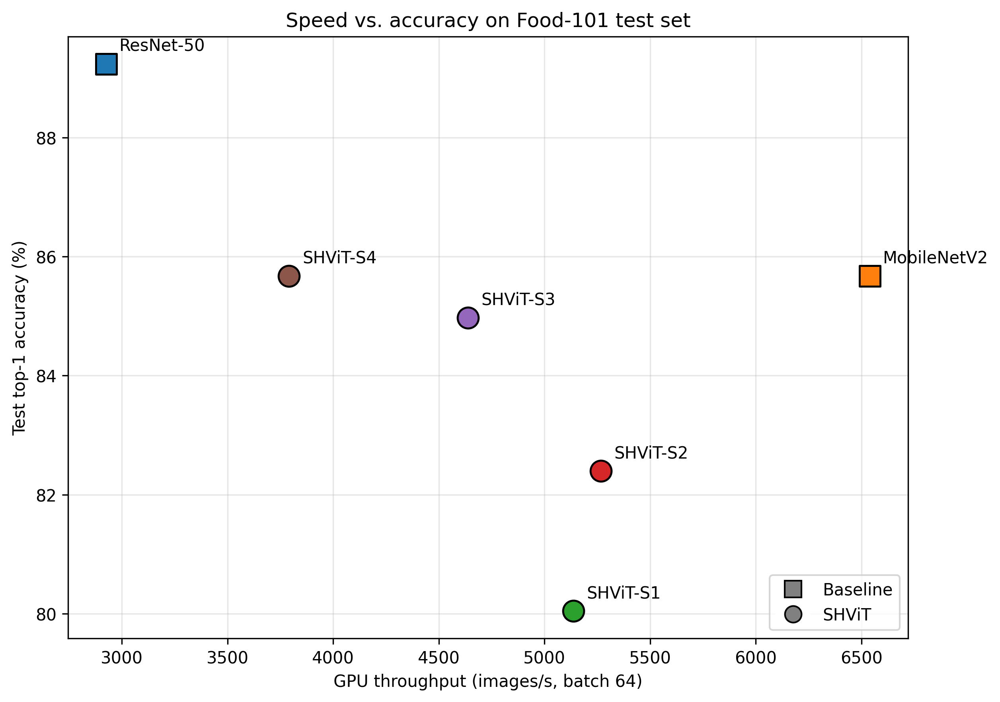

fig_training_curves.png


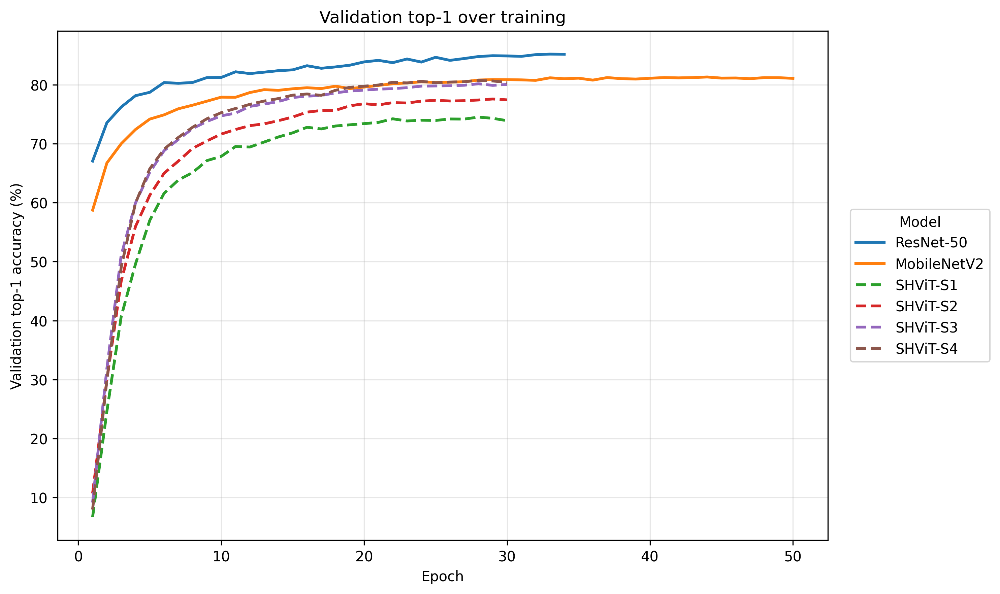

fig_accuracy_bars.png


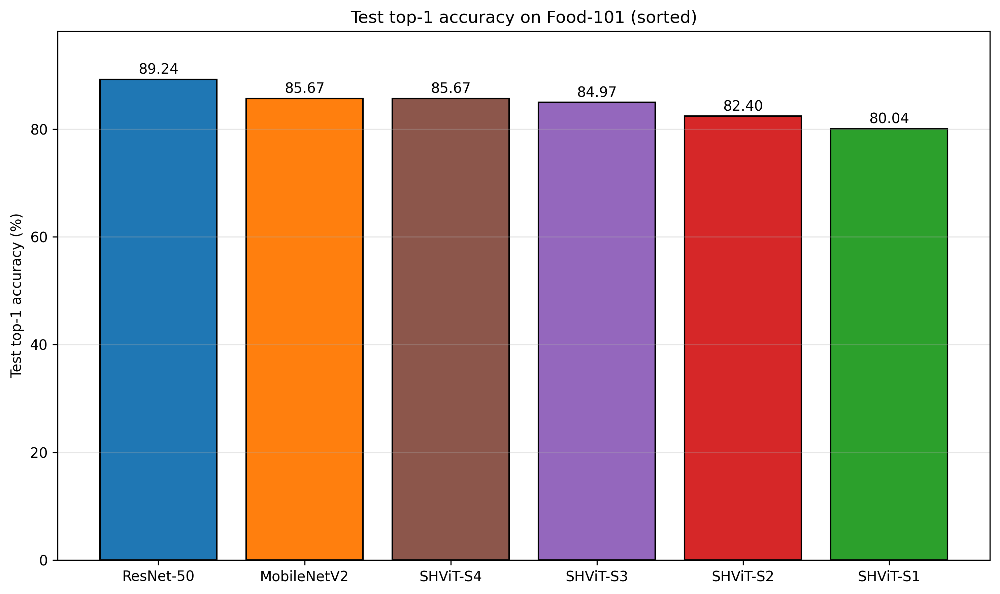

fig_train_loss.png


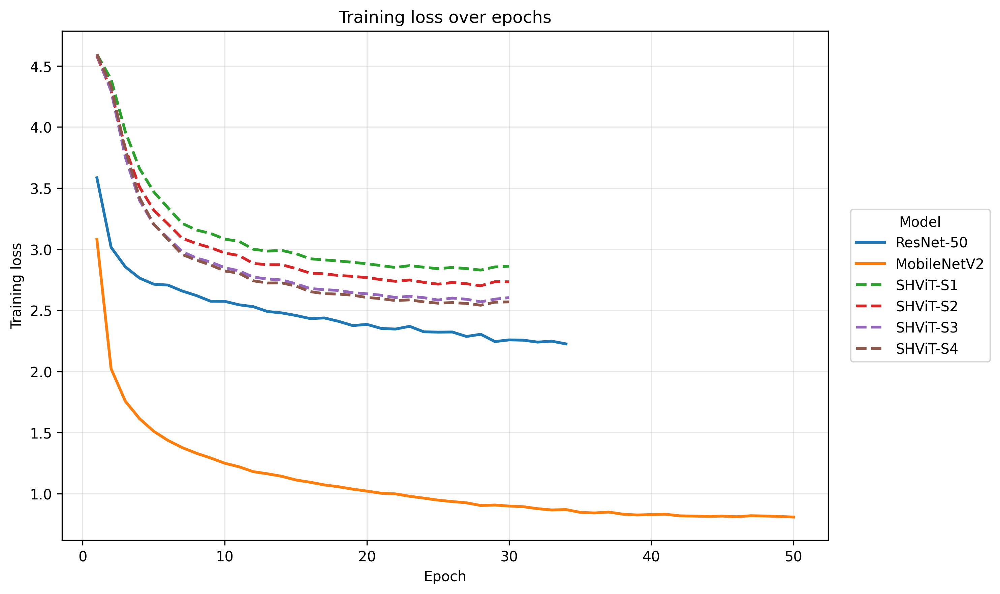

In [11]:
# Inline preview
from IPython.display import Image, display
for f in ['fig_speed_vs_accuracy.png', 'fig_training_curves.png',
          'fig_accuracy_bars.png', 'fig_train_loss.png']:
    p = f'{LOCAL_FIGURES}/{f}'
    if os.path.exists(p):
        print(f)
        display(Image(p, width=700))

## 8. Error analysis on SHViT-S4

Worst-15 categories, top-10 confused class pairs, confusion heatmap, misclassified image grid.

In [12]:
S4_CKPT = f'{STAGE3_LOCAL}/shvit_s4/best.pth'

!python /content/error_analysis.py \
    --results-dir {LOCAL_RESULTS} \
    --data-root   {LOCAL_DATA} \
    --shvit-dir   {SHVIT_DIR} \
    --checkpoint  "{S4_CKPT}" \
    --output-dir  {LOCAL_ERROR}

print('\nError analysis outputs:')
for f in sorted(os.listdir(LOCAL_ERROR)):
    sz = os.path.getsize(f'{LOCAL_ERROR}/{f}') / 1024
    print(f'  {f}  ({sz:.0f} KB)')


Worst-10 classes:
  steak                         52.00%
  pork_chop                     55.60%
  apple_pie                     60.00%
  bread_pudding                 63.20%
  ravioli                       64.00%
  foie_gras                     68.40%
  chocolate_mousse              69.60%
  huevos_rancheros              70.00%
  tuna_tartare                  70.40%
  ceviche                       71.60%

Best-10 classes:
  edamame                      100.00%
  macarons                      97.60%
  spaghetti_bolognese           96.40%
  pad_thai                      96.40%
  pho                           96.00%
  deviled_eggs                  96.00%
  frozen_yogurt                 96.00%
  takoyaki                      95.60%
  churros                       95.20%
  hot_and_sour_soup             95.20%

Top-10 most confused class pairs (true -> predicted):
  steak                        -> filet_mignon                  22.00%  (n=55)
  tuna_tartare                 -> beef_tartare   

confusion_top20.png


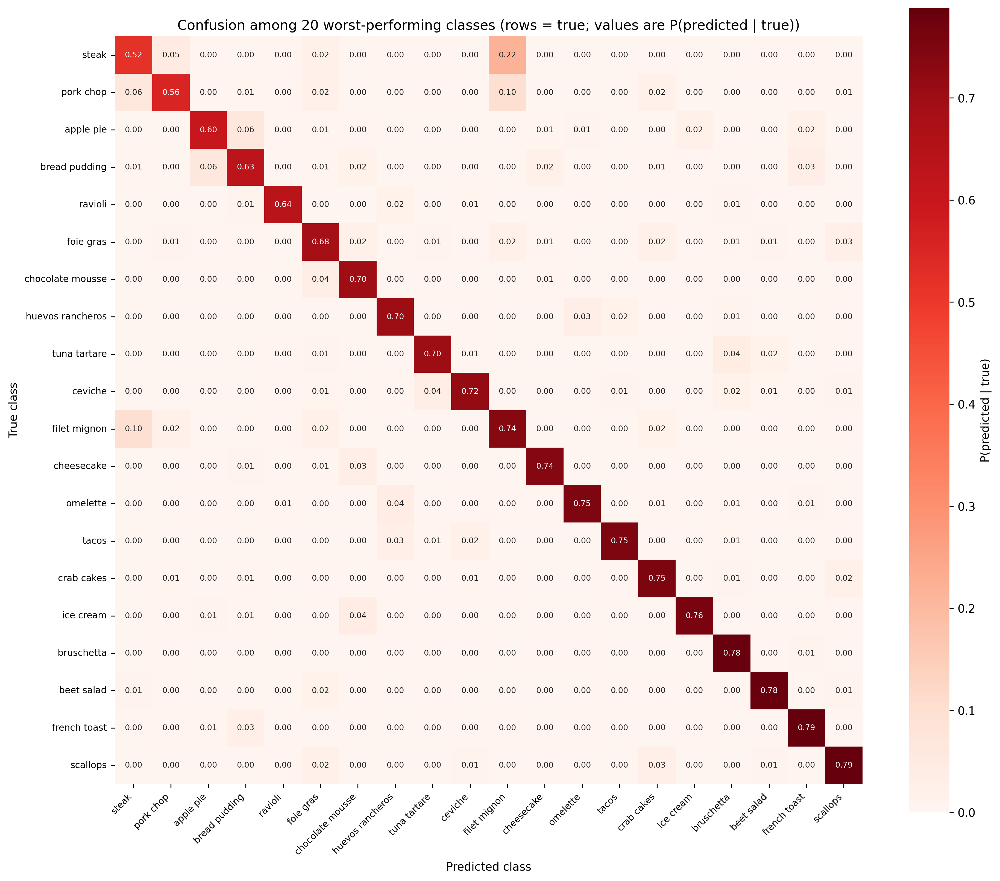

misclassified_grid.png


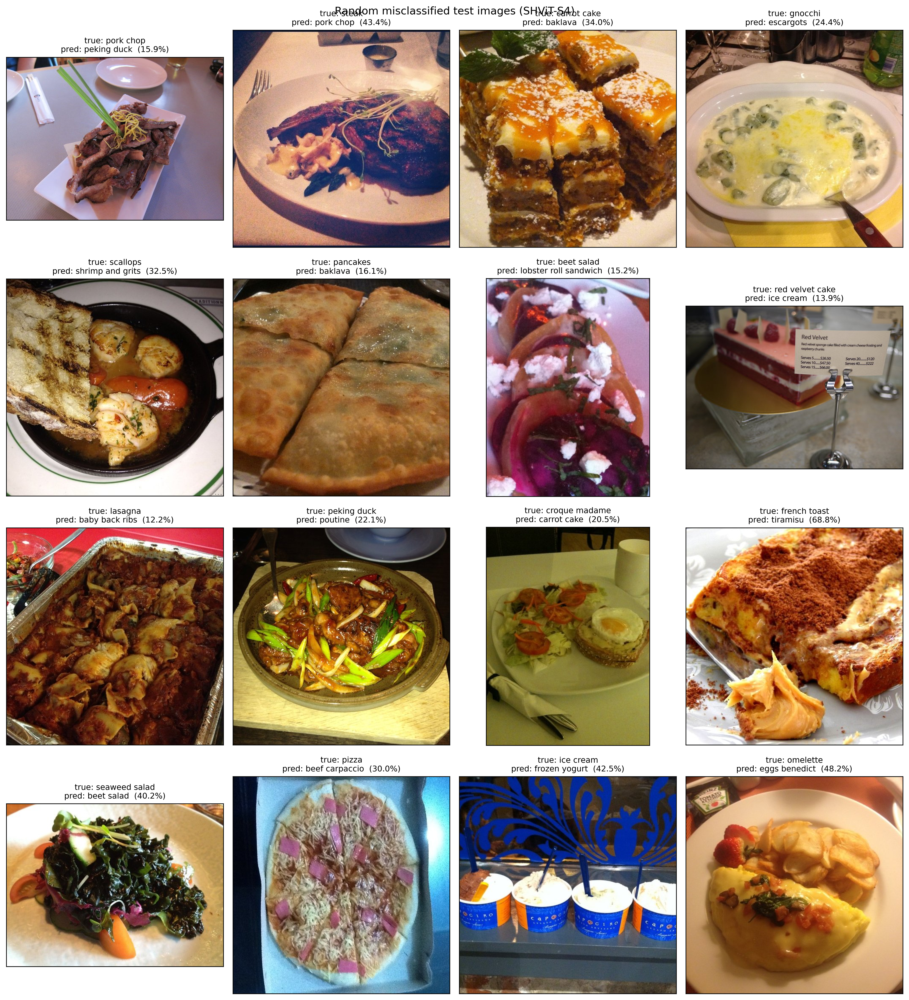

worst_15_categories.png


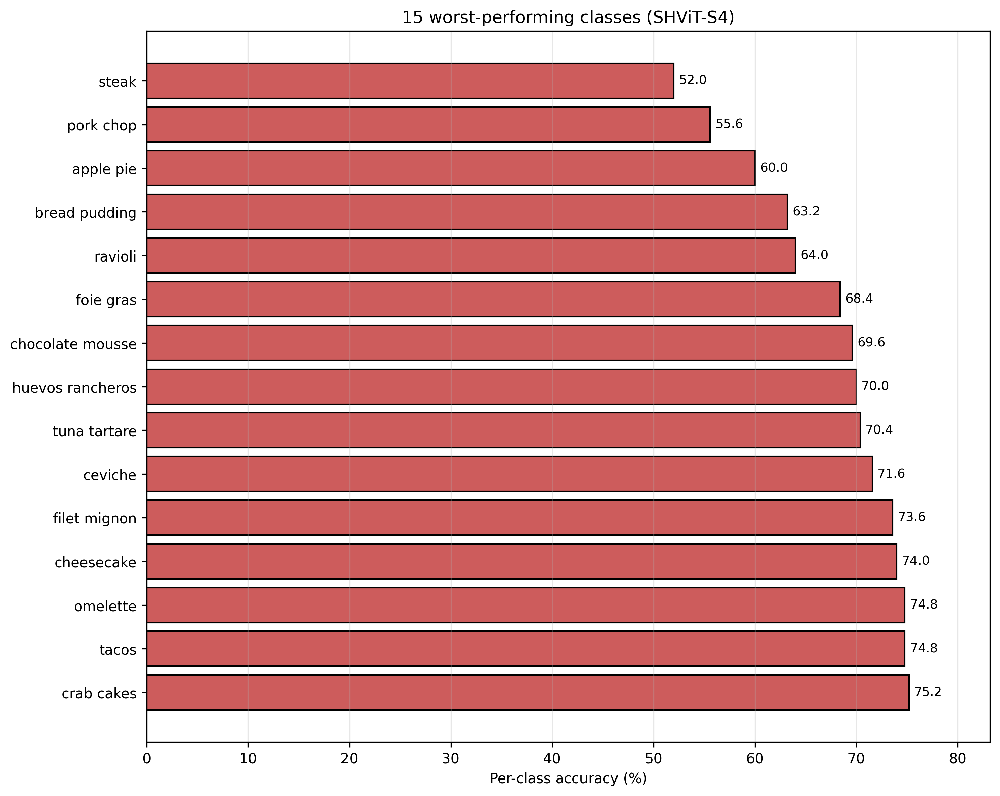

SHViT-S4 Error Analysis Summary

Overall:
  - Test set size       : 25,250 images
  - Test top-1 accuracy : 85.67%
  - Test top-5 accuracy : 97.14%

Worst-10 classes by per-class accuracy:
   1. steak                         52.00%
   2. pork_chop                     55.60%
   3. apple_pie                     60.00%
   4. bread_pudding                 63.20%
   5. ravioli                       64.00%
   6. foie_gras                     68.40%
   7. chocolate_mousse              69.60%
   8. huevos_rancheros              70.00%
   9. tuna_tartare                  70.40%
  10. ceviche                       71.60%

Best-10 classes (for context):
   1. edamame                      100.00%
   2. macarons                      97.60%
   3. spaghetti_bolognese           96.40%
   4. pad_thai                      96.40%
   5. pho                           96.00%
   6. deviled_eggs                  96.00%
   7. frozen_yogurt                 96.00%
   8. takoyaki                      95.60%
   9.

In [13]:
# Inline preview of error figures + summary text
for f in ['confusion_top20.png', 'misclassified_grid.png', 'worst_15_categories.png']:
    p = f'{LOCAL_ERROR}/{f}'
    if os.path.exists(p):
        print(f)
        display(Image(p, width=700))

summary = f'{LOCAL_ERROR}/error_analysis_summary.txt'
if os.path.exists(summary):
    with open(summary) as f:
        print(f.read())

## 9. Demo on a single image

Smoke test for `demo.py`. Pick any test image — the path below grabs the first ceviche image.

Edit `DEMO_IMAGE` to try other foods.

Using image: /content/food101_local/food-101/images/sushi/100332.jpg
Device: cuda

Top-5 predictions for 100332.jpg:
  1. sushi                         65.34%
  2. ceviche                        2.77%
  3. bruschetta                     1.44%
  4. spring_rolls                   1.08%
  5. scallops                       0.89%

Saved /content/analysis/demo_output/demo_output.png


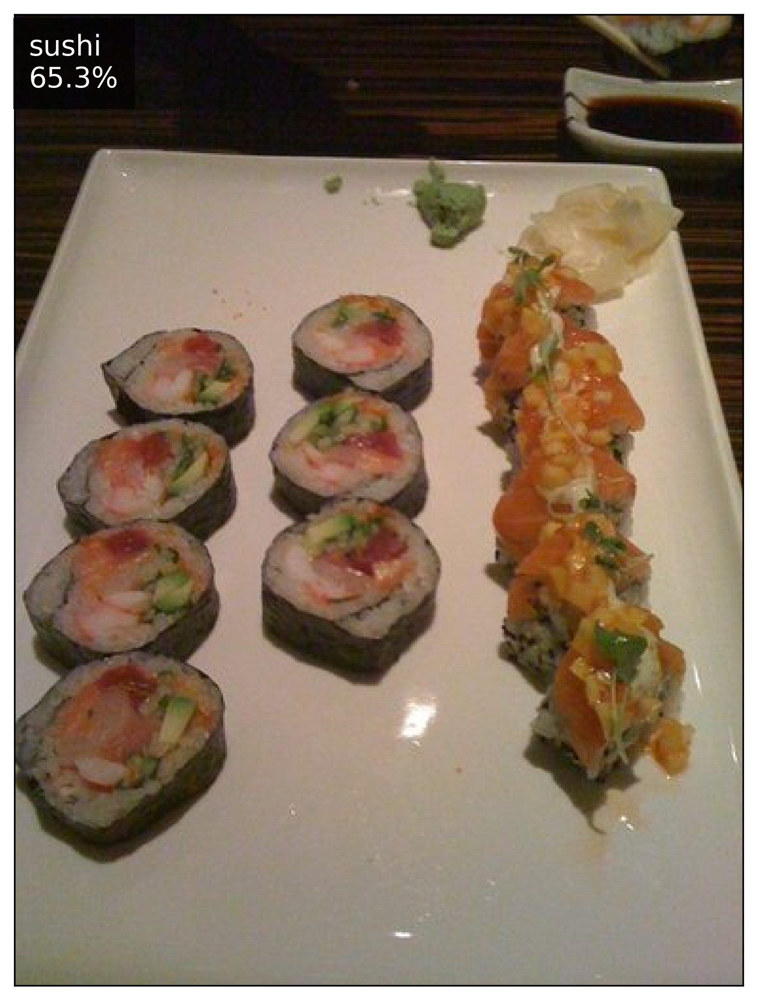

In [14]:
import glob
DEMO_IMAGE = sorted(glob.glob(f'{LOCAL_DATA}/food-101/images/sushi/*.jpg'))[0]
print('Using image:', DEMO_IMAGE)

DEMO_OUT = f'{LOCAL_DEMO}/demo_output.png'

!python /content/demo.py \
    --image       "{DEMO_IMAGE}" \
    --checkpoint  "{S4_CKPT}" \
    --shvit-dir   {SHVIT_DIR} \
    --data-root   {LOCAL_DATA} \
    --output      "{DEMO_OUT}"

if os.path.exists(DEMO_OUT):
    display(Image(DEMO_OUT, width=600))

## 10. Bundle everything for download

Zips the entire `/content/analysis/` folder so you can download it from the Colab file browser (right-click `analysis.zip` → Download). The zip excludes the local checkpoint copies (those are still on Drive).

In [15]:
ZIP_PATH = '/content/analysis.zip'
if os.path.exists(ZIP_PATH):
    os.remove(ZIP_PATH)

# Zip results, figures, EDA, error analysis, demo — skip checkpoints (large + already on Drive)
!cd {LOCAL_ROOT} && zip -rq {ZIP_PATH} \
    results figures eda_outputs error_analysis_outputs demo_output

size_mb = os.path.getsize(ZIP_PATH) / 1e6
print(f'Bundle ready: {ZIP_PATH}  ({size_mb:.1f} MB)')
print('Right-click analysis.zip in the file browser to download.')

Bundle ready: /content/analysis.zip  (23.9 MB)
Right-click analysis.zip in the file browser to download.


In [16]:
# Optional: also copy the bundle to Drive for safety
DRIVE_BUNDLE = '/content/drive/MyDrive/food101_analysis.zip'
shutil.copy(ZIP_PATH, DRIVE_BUNDLE)
print(f'Also saved to: {DRIVE_BUNDLE}')

Also saved to: /content/drive/MyDrive/food101_analysis.zip
